# Week 6 - Bivariate Analysis, part 2

# 1. Lesson: no lesson this week

# 2. Weekly graph question

Suppose you wanted to show the nitrate and phosphate level in a water sample.  What are the advantages and disadvantages of showing this as an area plot, as opposed to two separate line graphs?  How would you adjust the graphs shown to improve the presentation?

In [1]:
import numpy as np
import seaborn as sns
import pandas as pd
import os
import kagglehub
from kagglehub import KaggleDatasetAdapter
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick

C:\Users\abcbb\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


C:\Users\abcbb\AppData\Local\Temp\ipykernel_48788\2149468501.py:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  datearray = pd.date_range(start='2023/01/01', end='2024/01/01', freq='M')


Text(0, 0.5, 'Nitrate level (% of eutrophic value)')

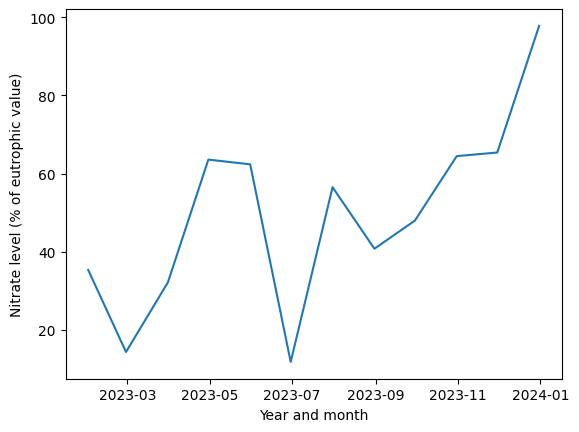

In [2]:
numdates = 12
np.random.seed(0)
time_series = 100 * (np.random.normal(size = numdates) / 5 + np.arange(numdates) / 16)
datearray = pd.date_range(start='2023/01/01', end='2024/01/01', freq='M')
ax = sns.lineplot(x = datearray, y = time_series)
ax.set_xlabel("Year and month")
ax.set_ylabel("Nitrate level (% of eutrophic value)")

C:\Users\abcbb\AppData\Local\Temp\ipykernel_48788\1726504607.py:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  datearray = pd.date_range(start='2023/01/01', end='2024/01/01', freq='M')


Text(0, 0.5, 'Phosphate level (% of eutrophic value)')

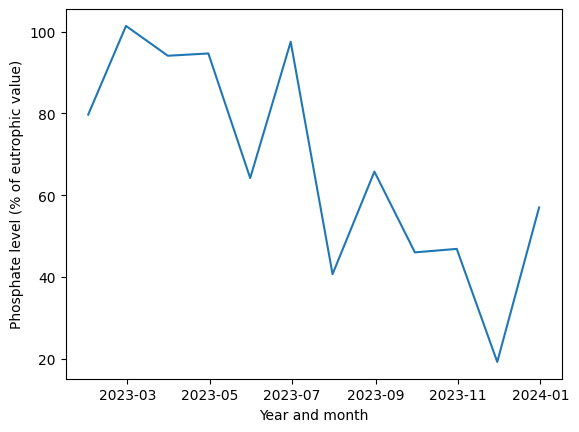

In [3]:
np.random.seed(1)
time_series_2 =  100 * (1 - (np.random.normal(size = numdates) / 8 + np.arange(numdates) / 16))
datearray = pd.date_range(start='2023/01/01', end='2024/01/01', freq='M')
ax = sns.lineplot(x = datearray, y = time_series_2)
ax.set_xlabel("Year and month")
ax.set_ylabel("Phosphate level (% of eutrophic value)")

<Axes: >

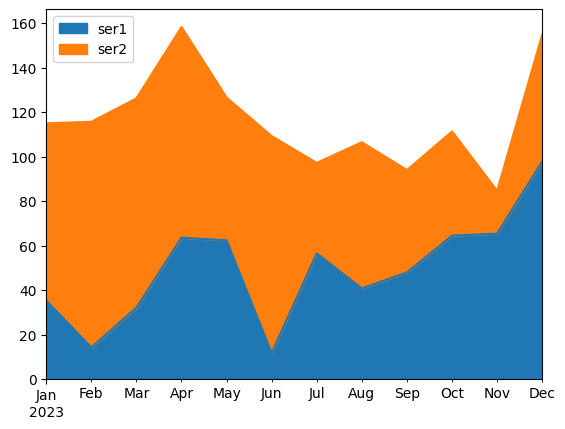

In [4]:
df = pd.DataFrame({'ser1': time_series, 'ser2': time_series_2}, index = datearray)
df.plot.area()

In [5]:
datearray

DatetimeIndex(['2023-01-31', '2023-02-28', '2023-03-31', '2023-04-30',
               '2023-05-31', '2023-06-30', '2023-07-31', '2023-08-31',
               '2023-09-30', '2023-10-31', '2023-11-30', '2023-12-31'],
              dtype='datetime64[ns]', freq='ME')

### Analysis of Graph Choice: Area Plot vs. Line Plot

**Question:** When visualising nitrate and phosphate levels in a water sample, what are the advantages and disadvantages of an area plot compared with two separate line graphs?

---

#### 1. Two Separate Line Graphs  

* **Advantages (Pros):**  
    * **Clear, side-by-side trend comparison** – Each substance is shown on its own line, so the direction and magnitude of change are immediately visible.  
    * **Precise value reading** – Point-by-point values can be read directly from the y-axis without extra mental arithmetic.  
    * **Minimal risk of misinterpretation** – Lines do not overlap, so one series never hides the other.  

* **Disadvantages (Cons):**  
    * **No direct sense of combined load** – The viewer cannot see the total amount of pollutants at a glance.  

#### 2. Single Stacked Area Plot  

* **Advantages (Pros):**  
    * **Shows cumulative load** – The total shaded area represents the combined concentration, which is useful if overall pollution is the key message.  

* **Disadvantages (Cons):**  
    * **Data occlusion** – The lower layer (for example, phosphate) can be partly hidden by the upper layer (nitrate), making its trend hard to judge.  
    * **Potentially misleading “total”** – If the sum of the two series is not meaningful, stacking may imply an inappropriate interpretation.  
    * **Harder to read exact values** – To know the upper-layer value, the viewer must mentally subtract the lower-layer height from the stack height.  

#### 3. Common Time-Series Axis Pitfall  

* **Issue:** With a monthly frequency (`freq="M"` or `"ME"`), *both* the `start` and `end` dates are included **only if** they fall exactly on the month-end boundary.  
  * Example 1 – **12 ticks** (desired)  
    ```python
    pd.date_range("2023-01-31", "2023-12-31", freq="M")
    # 2023-01-31 … 2023-12-31   → 12 points
    ```  
  * Example 2 – **13 ticks** (undesired wrap-around)  
    ```python
    pd.date_range("2023-01-31", "2024-01-31", freq="M")
    # 2023-01-31 … 2024-01-31   → 13 points (extra 2024-01-31)
    ```  
  * If you start on **`2023-01-01`** instead, that date is *not* a month-end, so Pandas drops it and you again get exactly 12 points (January through December).  

* **Effect:** When the index contains 13 monthly ticks but the x-axis labels are shown only as month names (`Jan, Feb, … Dec`), the final December point is visually connected back to the *next* January, breaking the continuity of the line or stacked area.

* **Solution:** Build an index with **exactly one tick per month**. Two reliable methods:  

  ```python
  # Option A – specify the number of periods
  idx = pd.date_range(start="2023-01-01", periods=12, freq="M")

  # Option B – construct year-month strings from an existing array
  ym_dates = datearray.strftime("%Y%m").tolist()   # ['202301', …, '202312']



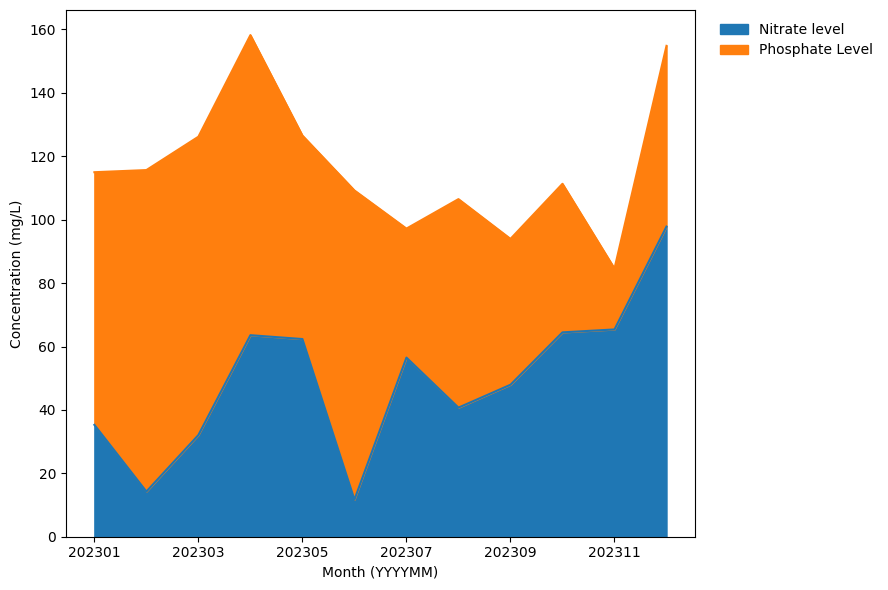

In [6]:
ym_dates = datearray.strftime('%Y%m').tolist()

df = pd.DataFrame({'Nitrate level': time_series, 'Phosphate Level': time_series_2}, index = ym_dates)
ax = df.plot.area(figsize=(9, 6))

ax.legend(loc='upper left', bbox_to_anchor=(1.02, 1), frameon=False)

ax.set_xlabel('Month (YYYYMM)')
ax.set_ylabel('Concentration (mg/L)')
plt.tight_layout()
plt.show()

# 3. Working on your datasets

This week, you will do the same types of exercises as last week, but you should use your chosen datasets that someone in your class found last semester. (They likely will not be the particular datasets that you found yourself.)

### Here are some types of analysis you can do:

- Find correlations between pairs of variables.

- Draw scatterplots, especially when the correlation is large.

- Draw pairplots.

- Draw line graphs and/or area graphs when there is date or time data together with numerical data.

### Conclusions:

- Explain what conclusions you would draw from this analysis: are the data what you expect?  Are the data likely to be usable?  If the data are not useable, find some new data!

- Do you see any outliers?  (Data points that are far from the rest of the data).

- Are any data items highly correlated with each other, suggesting that they are redundant?

- For the line plots, do you see a trend or pattern over time?  Does this suggest that the data are changing over time (drifting) in such a way as to invalidate comparisons?

- Can you think of any confounding variables?  (Third variables that could explain any correlations between other variables.  These third variables may or may not be reported in the dataset.)

In [7]:
print(os.listdir())
print(os.getcwd()) 

path = kagglehub.dataset_download("abcbbong/bu-699-o2")

print("Path to dataset files:", path)



df_fraud_train = pd.read_csv(os.path.join(path, 'fraud_train_processed.csv'))
df_fraud_test = pd.read_csv(os.path.join(path, 'fraud_test_processed.csv'))          
df_credit_approval = pd.read_csv(os.path.join(path, 'credit_approval_processed.csv'))
df_loan_default = pd.read_csv(os.path.join(path, 'loan_default_processed.csv'))

['OMDS-MODB2-Week1-Lee-JaeHoon.ipynb', 'OMDS-MODB2-Week2-Lee-JaeHoon.ipynb', 'OMDS-MODB2-Week3-Lee-JaeHoon.ipynb', '.venv', '.git', 'README.md', '.gitignore', 'OMDS-MODB2-Week5-Lee-JaeHoon.ipynb', 'twoclouds.png', 'histogram.png', 'threeclouds.png', 'OMDS-MODB2-Week4-Lee-JaeHoon.ipynb', 'OMDS-MODB2-Week6-Lee-JaeHoon.ipynb', 'OMDS-MODB2-Week7-Lee-JaeHoon.ipynb', 'OMDS-MODB2-Week8-Lee-JaeHoon.ipynb', 'OMDS-MODB2-Week9-Lee-JaeHoon.ipynb']
f:\BU\CDSDX 699 O2\Homework
Path to dataset files: C:\Users\abcbb\.cache\kagglehub\datasets\abcbbong\bu-699-o2\versions\3


In [8]:
df_fraud_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 35 columns):
 #   Column                   Non-Null Count    Dtype  
---  ------                   --------------    -----  
 0   trans_date_trans_time    1296675 non-null  object 
 1   cc_num                   1296675 non-null  int64  
 2   merchant                 1296675 non-null  object 
 3   category                 1296675 non-null  object 
 4   amt                      1296675 non-null  float64
 5   first                    1296675 non-null  object 
 6   last                     1296675 non-null  object 
 7   gender                   1296675 non-null  object 
 8   street                   1296675 non-null  object 
 9   city                     1296675 non-null  object 
 10  state                    1296675 non-null  object 
 11  zip                      1296675 non-null  int64  
 12  lat                      1296675 non-null  float64
 13  long                     1296675 non-null 

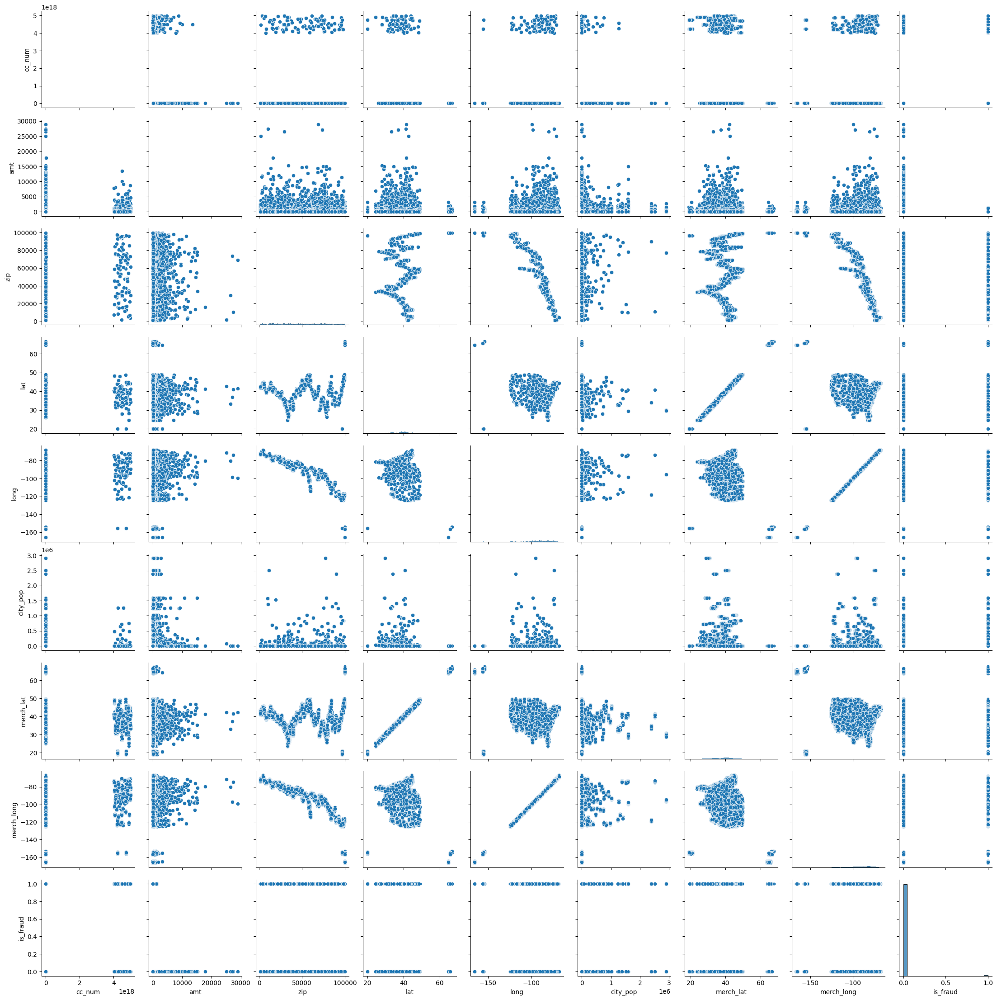

In [9]:
sns.pairplot(df_fraud_train.iloc[:,:21])

<Axes: >

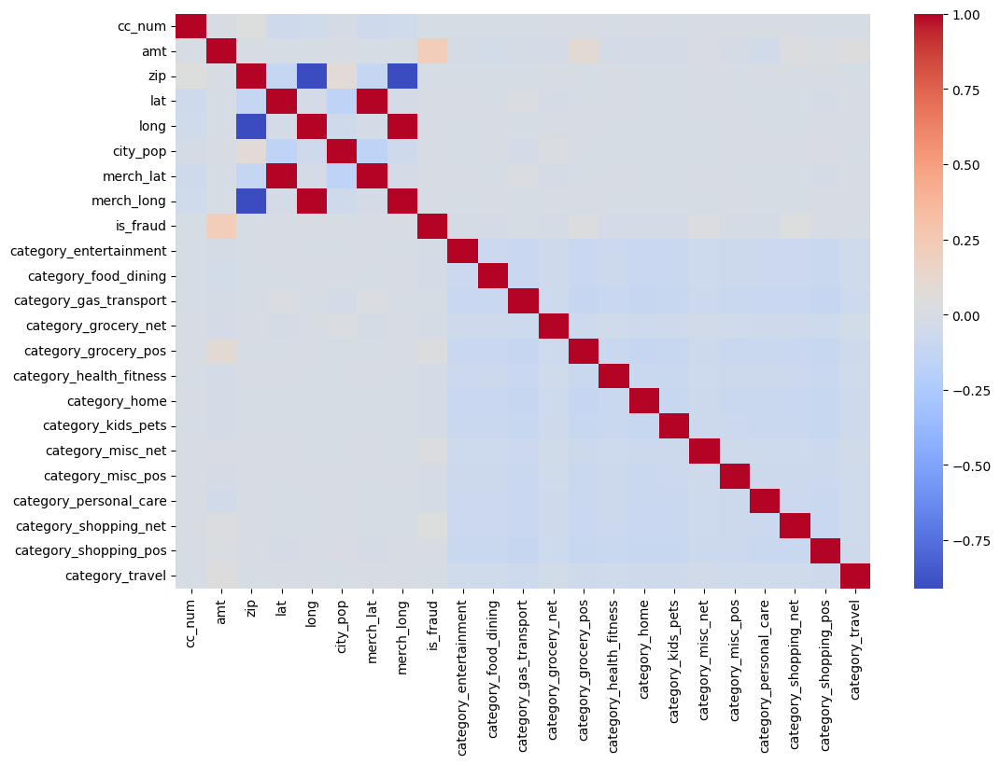

In [10]:
num_df_fraud = df_fraud_train.select_dtypes(include='number')
plt.figure(figsize=(12,8)); sns.heatmap(num_df_fraud.corr(), annot=False, cmap='coolwarm')

In [11]:
num_df_fraud.corr()

,cc_num,amt,zip,lat,long,city_pop,merch_lat,merch_long,is_fraud,category_entertainment,...,category_grocery_pos,category_health_fitness,category_home,category_kids_pets,category_misc_net,category_misc_pos,category_personal_care,category_shopping_net,category_shopping_pos,category_travel
cc_num,1.000000,0.001769,0.041459,-0.059271,-0.048278,-0.008991,-0.058942,-0.048252,-0.000981,-0.001274,...,0.003191,-0.000901,0.001548,-0.000746,0.000898,0.001006,0.000685,0.000561,-0.000364,-0.001458
amt,0.001769,1.000000,0.001843,-0.001926,-0.000187,0.005818,-0.001873,-0.000151,0.219404,-0.010709,...,0.094389,-0.026860,-0.024408,-0.024701,0.014856,-0.011905,-0.038303,0.032153,0.018492,0.046097
zip,0.041459,0.001843,1.000000,-0.114290,-0.909732,0.078467,-0.113561,-0.908924,-0.002162,0.000149,...,-0.001326,0.001971,-0.000278,0.000043,0.003606,-0.005800,0.002696,0.005773,0.000691,-0.004397
lat,-0.059271,-0.001926,-0.114290,1.000000,-0.015533,-0.155730,0.993592,-0.015509,0.001894,0.002657,...,-0.000514,0.004764,-0.002498,-0.001151,0.003778,-0.003213,-0.002519,-0.001216,-0.009322,0.003001
long,-0.048278,-0.000187,-0.909732,-0.015533,1.000000,-0.052715,-0.015452,0.999120,0.001721,-0.000573,...,0.000463,-0.002698,0.000163,-0.000322,-0.003693,0.006269,-0.001948,-0.004617,0.000912,0.003055
city_pop,-0.008991,0.005818,0.078467,-0.155730,-0.052715,1.000000,-0.154781,-0.052687,0.002136,-0.000047,...,-0.002758,-0.003465,-0.002624,-0.000917,-0.002028,0.004502,0.000405,0.003565,0.011691,-0.002169
merch_lat,-0.058942,-0.001873,-0.113561,0.993592,-0.015452,-0.154781,1.000000,-0.015431,0.001741,0.002570,...,-0.000609,0.004837,-0.002501,-0.001046,0.003603,-0.003271,-0.002543,-0.001126,-0.009187,0.003069
merch_long,-0.048252,-0.000151,-0.908924,-0.015509,0.999120,-0.052687,-0.015431,1.000000,0.001721,-0.000586,...,0.000468,-0.002649,0.000130,-0.000272,-0.003679,0.006268,-0.001994,-0.004573,0.000906,0.003072
is_fraud,-0.000981,0.219404,-0.002162,0.001894,0.001721,0.002136,0.001741,0.001721,1.000000,-0.012200,...,0.035558,-0.014885,-0.017848,-0.014967,0.025886,-0.008937,-0.012167,0.044261,0.005955,-0.006924
category_entertainment,-0.001274,-0.010709,0.000149,0.002657,-0.000573,-0.000047,0.002570,-0.000586,-0.012200,1.000000,...,-0.090771,-0.074462,-0.090558,-0.086402,-0.063333,-0.071529,-0.076702,-0.079742,-0.087916,-0.050207


(0.0, 2000.0)

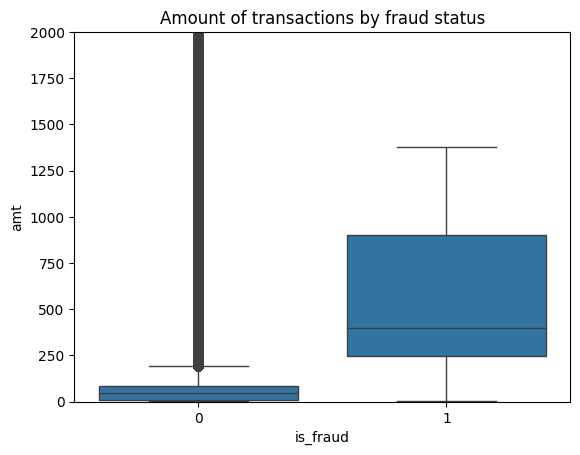

In [12]:
sns.boxplot(data=df_fraud_train, x='is_fraud', y='amt')
plt.title('Amount of transactions by fraud status')
plt.ylim(0, 2000)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13],
 [Text(0, 0, 'misc_net'),
  Text(1, 0, 'grocery_pos'),
  Text(2, 0, 'entertainment'),
  Text(3, 0, 'gas_transport'),
  Text(4, 0, 'misc_pos'),
  Text(5, 0, 'grocery_net'),
  Text(6, 0, 'shopping_net'),
  Text(7, 0, 'shopping_pos'),
  Text(8, 0, 'food_dining'),
  Text(9, 0, 'personal_care'),
  Text(10, 0, 'health_fitness'),
  Text(11, 0, 'travel'),
  Text(12, 0, 'kids_pets'),
  Text(13, 0, 'home')])

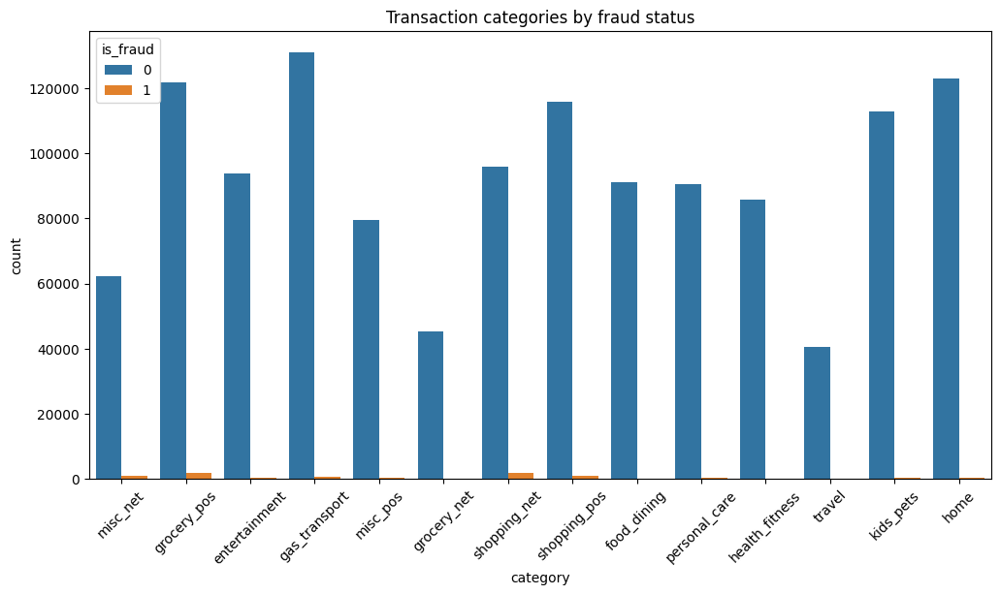

In [13]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df_fraud_train, x='category', hue='is_fraud')
plt.title('Transaction categories by fraud status')
plt.xticks(rotation=45)

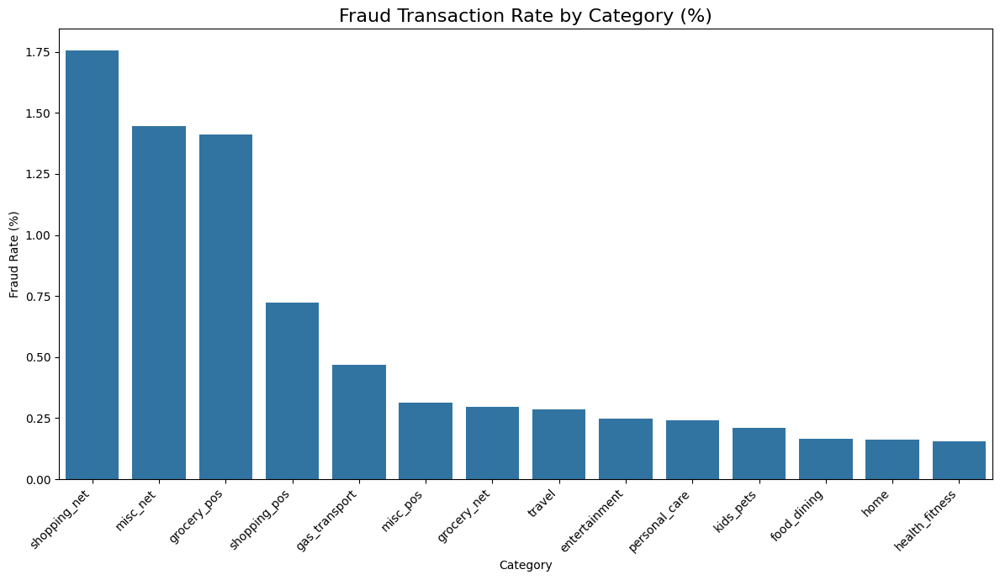

In [14]:
# --- Step 1: Data Preparation - Calculate the fraud rate by category ---

# Calculate total transaction counts for each category
total_counts = df_fraud_train.groupby('category')['is_fraud'].count()

# Calculate the number of fraudulent transactions for each category
fraud_counts = df_fraud_train.groupby('category')['is_fraud'].sum()

# Calculate the fraud rate in percent and sort the results
fraud_rate = (fraud_counts / total_counts * 100).sort_values(ascending=False)


# --- Step 2: Visualization ---

plt.figure(figsize=(12, 7))

# Create a bar plot of the calculated fraud rates
sns.barplot(x=fraud_rate.index, y=fraud_rate.values)

plt.title('Fraud Transaction Rate by Category (%)', fontsize=16)
plt.xlabel('Category')
plt.ylabel('Fraud Rate (%)')
plt.xticks(rotation=45, ha='right') # Rotate labels for better readability
plt.tight_layout() # Adjust plot to ensure everything fits without overlapping

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13],
 [Text(0, 0, 'grocery_pos'),
  Text(1, 0, 'shopping_net'),
  Text(2, 0, 'misc_net'),
  Text(3, 0, 'shopping_pos'),
  Text(4, 0, 'gas_transport'),
  Text(5, 0, 'misc_pos'),
  Text(6, 0, 'kids_pets'),
  Text(7, 0, 'entertainment'),
  Text(8, 0, 'personal_care'),
  Text(9, 0, 'home'),
  Text(10, 0, 'food_dining'),
  Text(11, 0, 'grocery_net'),
  Text(12, 0, 'health_fitness'),
  Text(13, 0, 'travel')])

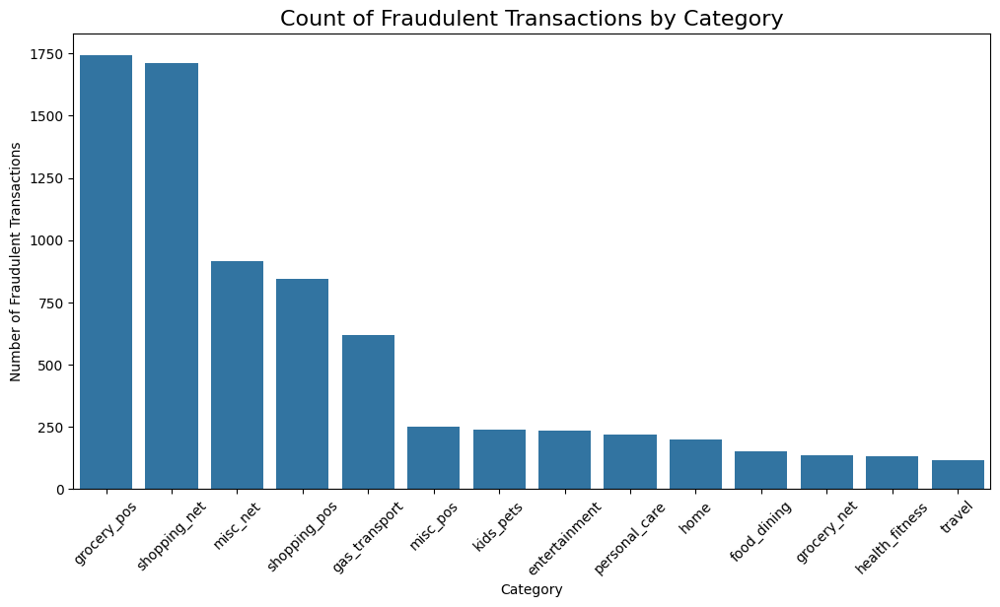

In [15]:
# 1. Filter for fraudulent transactions only
df_fraud_only = df_fraud_train[df_fraud_train['is_fraud'] == 1]

# 2. Determine the sort order based on the count of fraudulent transactions by category
order_by_fraud_count = df_fraud_only['category'].value_counts().index

# 3. Create a bar chart for only the fraudulent transactions
plt.figure(figsize=(12, 6))
# Sort the bars using the 'order' parameter
sns.countplot(data=df_fraud_only, x='category', order=order_by_fraud_count) 
plt.title('Count of Fraudulent Transactions by Category', fontsize=16)
plt.xlabel('Category')
plt.ylabel('Number of Fraudulent Transactions')
plt.xticks(rotation=45)

([<matplotlib.axis.XTick at 0x25ecc0229f0>,
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10'),
  Text(11, 0, '11'),
  Text(12, 0, '12'),
  Text(13, 0, '13'),
  Text(14, 0, '14'),
  Text(15, 0, '15'),
  Text(16, 0, '16'),
  Text(17, 0, '17'),
  Text(18, 0, '18'),
  Text(19, 0, '19'),
  Text(20, 0, '20'),
  Text(21, 0, '21'),
  Text(22, 0, '22'),
  Text(23, 0, '23')])

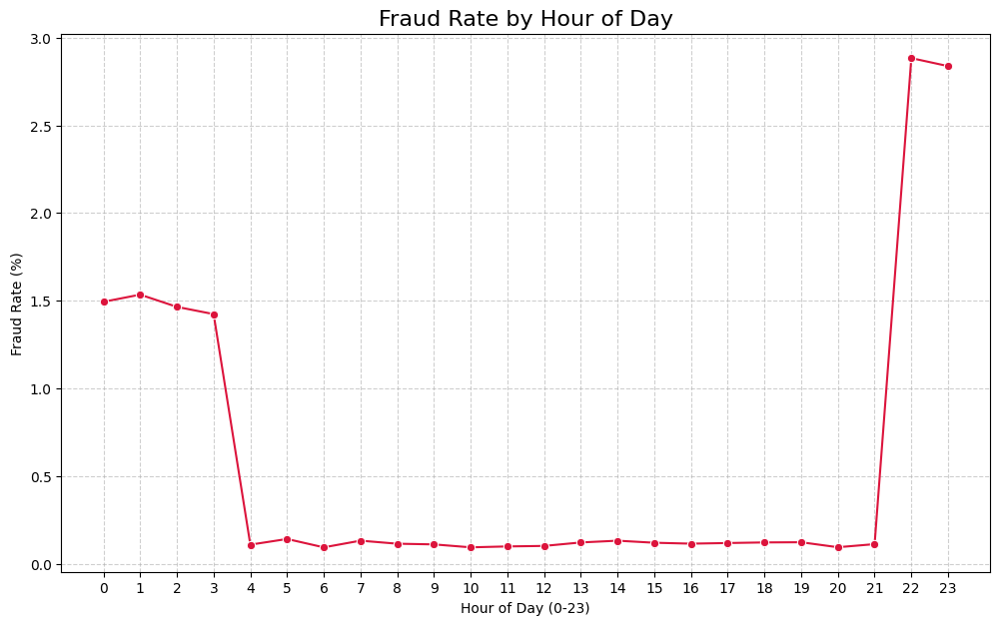

In [16]:
# --- Step 1: Feature Engineering - Create 'hour' column ---

# Convert 'trans_date_trans_time' from object to datetime
df_fraud_train['trans_date_trans_time'] = pd.to_datetime(df_fraud_train['trans_date_trans_time'])

# Extract the hour and create a new 'hour' column
df_fraud_train['hour'] = df_fraud_train['trans_date_trans_time'].dt.hour


# --- Step 2: Analysis - Calculate fraud rate by hour ---

# Calculate total transactions per hour
total_counts_by_hour = df_fraud_train.groupby('hour')['is_fraud'].count()

# Calculate fraudulent transactions per hour
fraud_counts_by_hour = df_fraud_train.groupby('hour')['is_fraud'].sum()

# Calculate fraud rate per hour (%)
fraud_rate_by_hour = (fraud_counts_by_hour / total_counts_by_hour) * 100


# --- Step 3: Visualization ---

plt.figure(figsize=(12, 7))
# Use a lineplot to show the trend over time
sns.lineplot(x=fraud_rate_by_hour.index, y=fraud_rate_by_hour.values, marker='o', color='crimson')

plt.title('Fraud Rate by Hour of Day', fontsize=16)
plt.xlabel('Hour of Day (0-23)')
plt.ylabel('Fraud Rate (%)')
plt.grid(True, linestyle='--', alpha=0.6)
# Ensure all 24 hours are marked on the x-axis
plt.xticks(range(0, 24))

In [17]:
df_credit_approval.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25128 entries, 0 to 25127
Data columns (total 46 columns):
 #   Column                                                          Non-Null Count  Dtype 
---  ------                                                          --------------  ----- 
 0   Applicant_ID                                                    25128 non-null  int64 
 1   Applicant_Gender                                                25128 non-null  object
 2   Owned_Car                                                       25128 non-null  int64 
 3   Owned_Realty                                                    25128 non-null  int64 
 4   Total_Children                                                  25128 non-null  int64 
 5   Total_Income                                                    25128 non-null  int64 
 6   Income_Type                                                     25128 non-null  object
 7   Education_Type                                            

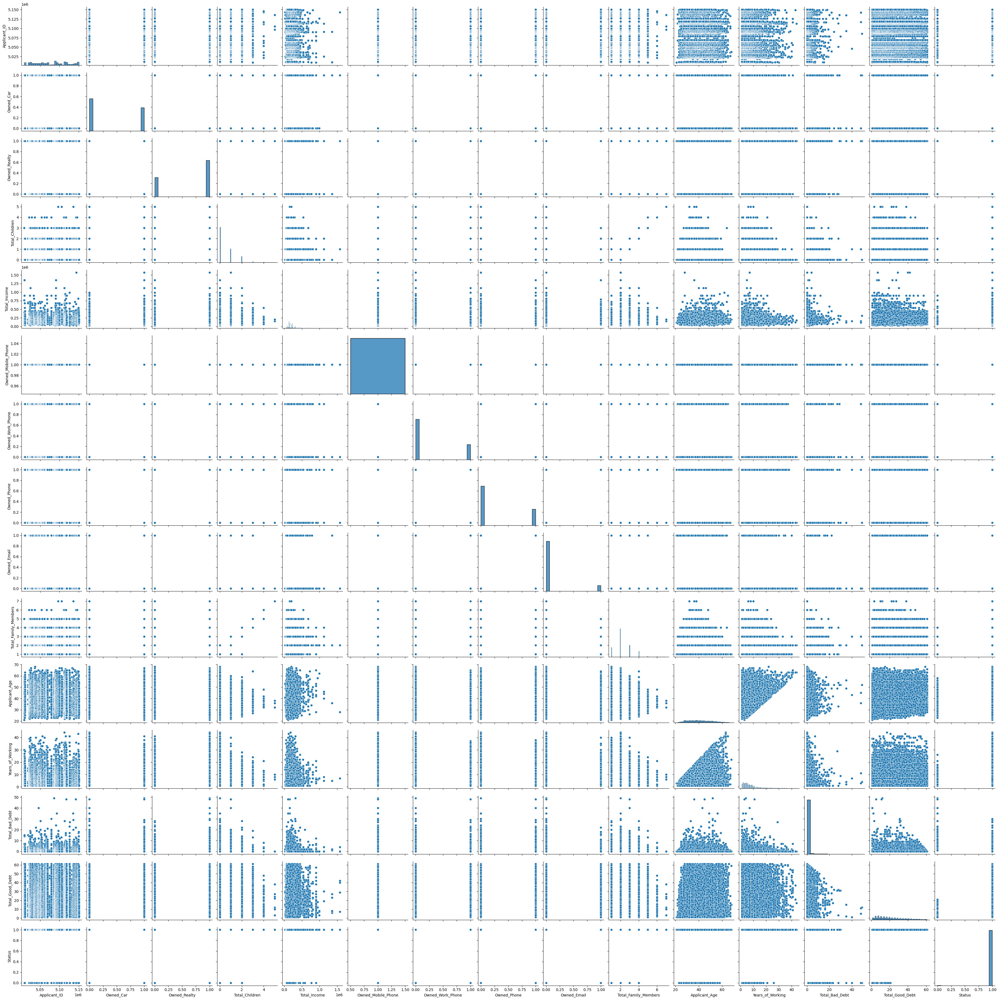

In [18]:
sns.pairplot(df_credit_approval.iloc[:,:21])

<Axes: >

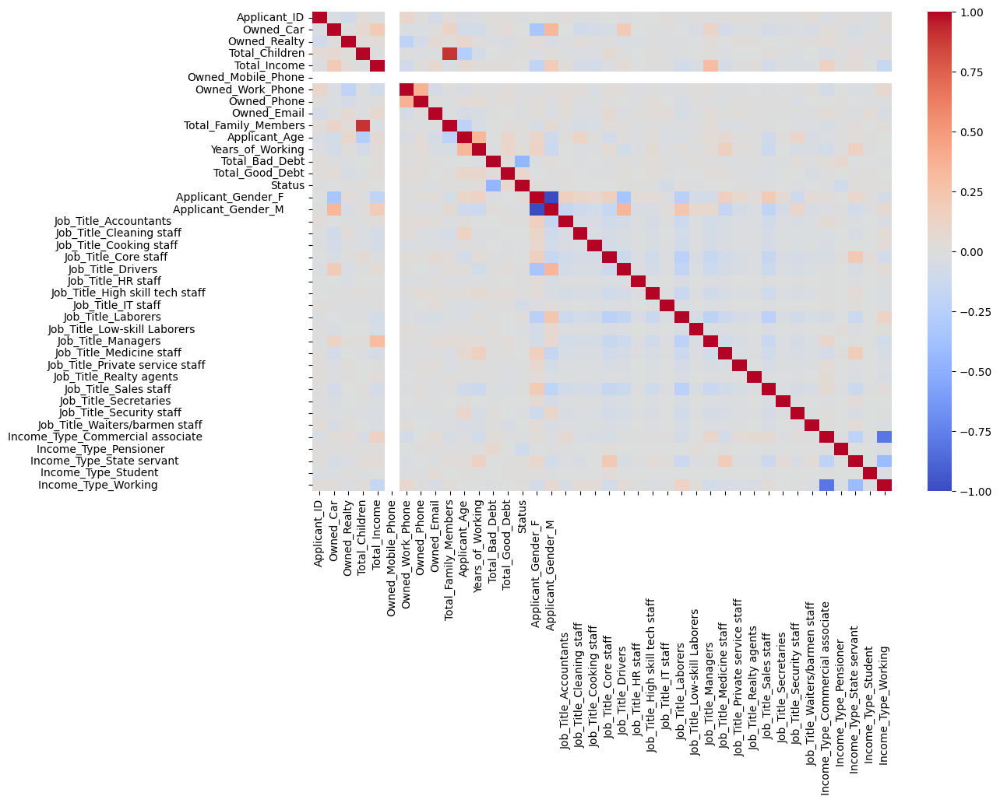

In [19]:
num_df_card = df_credit_approval.select_dtypes(include='number')
plt.figure(figsize=(12,8)); sns.heatmap(num_df_card.corr(), annot=False, cmap='coolwarm')

In [20]:
num_df_card.corr()

,Applicant_ID,Owned_Car,Owned_Realty,Total_Children,Total_Income,Owned_Mobile_Phone,Owned_Work_Phone,Owned_Phone,Owned_Email,Total_Family_Members,...,Job_Title_Realty agents,Job_Title_Sales staff,Job_Title_Secretaries,Job_Title_Security staff,Job_Title_Waiters/barmen staff,Income_Type_Commercial associate,Income_Type_Pensioner,Income_Type_State servant,Income_Type_Student,Income_Type_Working
Applicant_ID,1.000000,-0.025122,-0.086180,0.032139,-0.019236,NaN,0.087290,0.013126,-0.062862,0.024264,...,0.014212,0.003723,0.006512,0.004714,0.041154,-0.024032,0.009307,0.009145,-0.028975,0.017438
Owned_Car,-0.025122,1.000000,0.005219,0.069889,0.197574,NaN,-0.022982,-0.024571,0.000403,0.114689,...,-0.010162,-0.070036,-0.037761,-0.022170,-0.045250,0.017165,0.005538,-0.050048,-0.016923,0.015071
Owned_Realty,-0.086180,0.005219,1.000000,0.021575,0.034507,NaN,-0.209380,-0.063773,0.061213,0.019551,...,0.013848,-0.000344,-0.003135,0.000156,0.012855,0.034180,0.001789,-0.019251,0.014483,-0.020597
Total_Children,0.032139,0.069889,0.021575,1.000000,-0.015182,NaN,-0.011658,-0.021171,-0.014728,0.898460,...,-0.000231,0.007922,0.002747,-0.021876,-0.007657,-0.035965,0.003158,0.027042,-0.008094,0.017002
Total_Income,-0.019236,0.197574,0.034507,-0.015182,1.000000,NaN,-0.090286,0.010889,0.076031,-0.026003,...,0.028296,-0.076215,-0.019905,-0.026452,-0.030572,0.141117,0.013649,0.032077,-0.006784,-0.150660
Owned_Mobile_Phone,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Owned_Work_Phone,0.087290,-0.022982,-0.209380,-0.011658,-0.090286,NaN,1.000000,0.369395,-0.067214,0.007215,...,-0.007377,-0.008792,-0.000390,-0.011219,0.019040,-0.074996,-0.002194,-0.024776,-0.012250,0.085197
Owned_Phone,0.013126,-0.024571,-0.063773,-0.021171,0.010889,NaN,0.369395,1.000000,0.009116,-0.008744,...,0.006051,0.011083,0.004296,-0.030160,-0.005970,-0.006114,0.008440,-0.000712,-0.012837,0.006231
Owned_Email,-0.062862,0.000403,0.061213,-0.014728,0.076031,NaN,-0.067214,0.009116,1.000000,-0.009114,...,0.002471,-0.011818,0.003074,0.002960,-0.008666,0.043555,0.004019,-0.009102,0.046371,-0.036890
Total_Family_Members,0.024264,0.114689,0.019551,0.898460,-0.026003,NaN,0.007215,-0.008744,-0.009114,1.000000,...,0.009174,0.004685,-0.004982,-0.017077,-0.020931,-0.039793,0.002285,0.024913,-0.001961,0.021636


Value counts for the 'Status' column:
Status
1    25007
0      121
Name: count, dtype: int64


C:\Users\abcbb\AppData\Local\Temp\ipykernel_48788\4000119476.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_credit_approval, x='Status', palette='pastel')


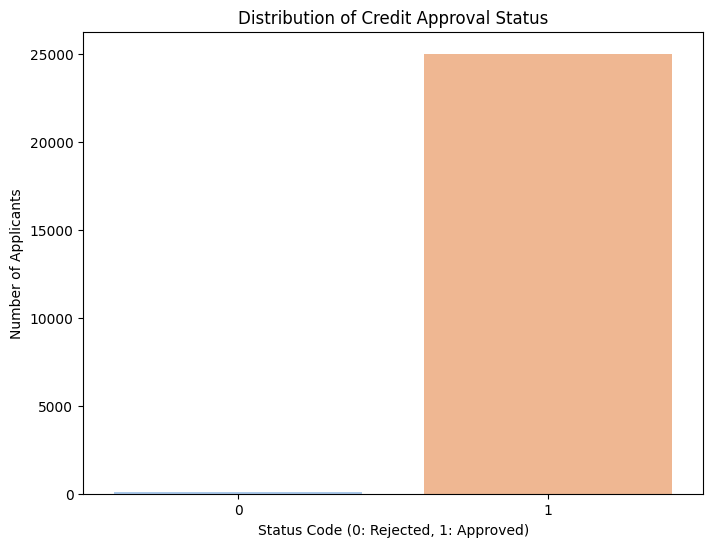

In [21]:
# Check the unique values and their counts in the 'Status' column
status_counts = df_credit_approval['Status'].value_counts()
print("Value counts for the 'Status' column:")
print(status_counts)

# Visualize the distribution of the 'Status' column
plt.figure(figsize=(8, 6))
sns.countplot(data=df_credit_approval, x='Status', palette='pastel')
plt.title('Distribution of Credit Approval Status')
plt.xlabel('Status Code (0: Rejected, 1: Approved)')
plt.ylabel('Number of Applicants')
plt.show()

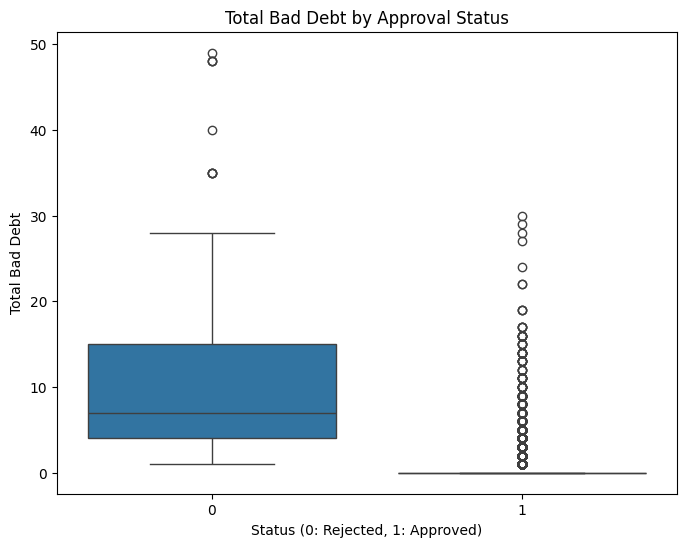

In [22]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=df_credit_approval, x='Status', y='Total_Bad_Debt')
plt.title('Total Bad Debt by Approval Status')
plt.xlabel('Status (0: Rejected, 1: Approved)')
plt.ylabel('Total Bad Debt')
plt.show()

C:\Users\abcbb\AppData\Local\Temp\ipykernel_48788\1005459574.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_credit_approval, x='Status', y='Applicant_Age', palette='muted')


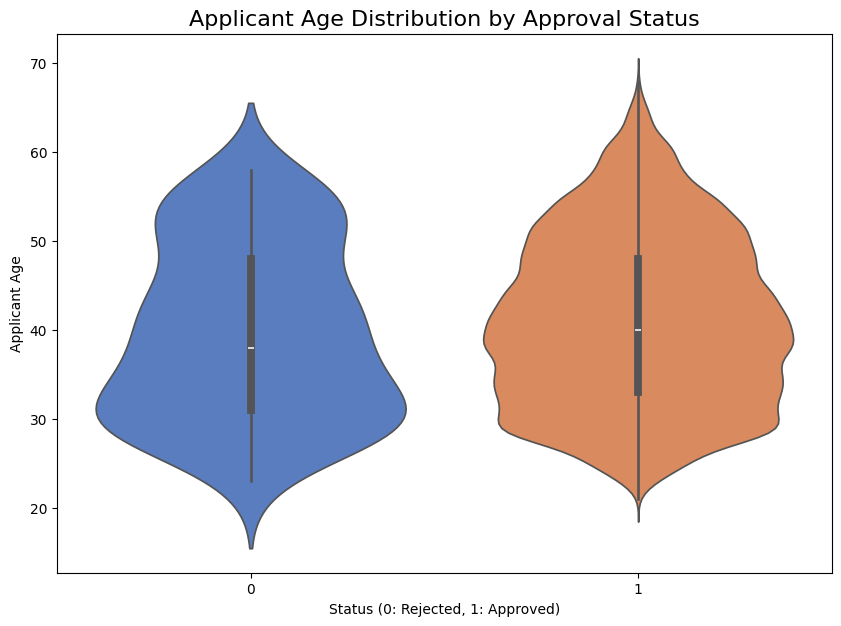

In [23]:
# Create a violin plot to see the distribution of age for each status
plt.figure(figsize=(10, 7))
sns.violinplot(data=df_credit_approval, x='Status', y='Applicant_Age', palette='muted')

plt.title('Applicant Age Distribution by Approval Status', fontsize=16)
plt.xlabel('Status (0: Rejected, 1: Approved)')
plt.ylabel('Applicant Age')
plt.show()

Approval Rate by Education Type (%):
Education_Type
Academic degree                                       100.000000
Secondary / secondary special                          99.541721
Higher education                                       99.495233
Incomplete higher                                      99.395770
Lower secondary                                        98.930481
Name: Status, dtype: float64


C:\Users\abcbb\AppData\Local\Temp\ipykernel_48788\439794038.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=approval_rate_by_education.values, y=approval_rate_by_education.index, palette='plasma')


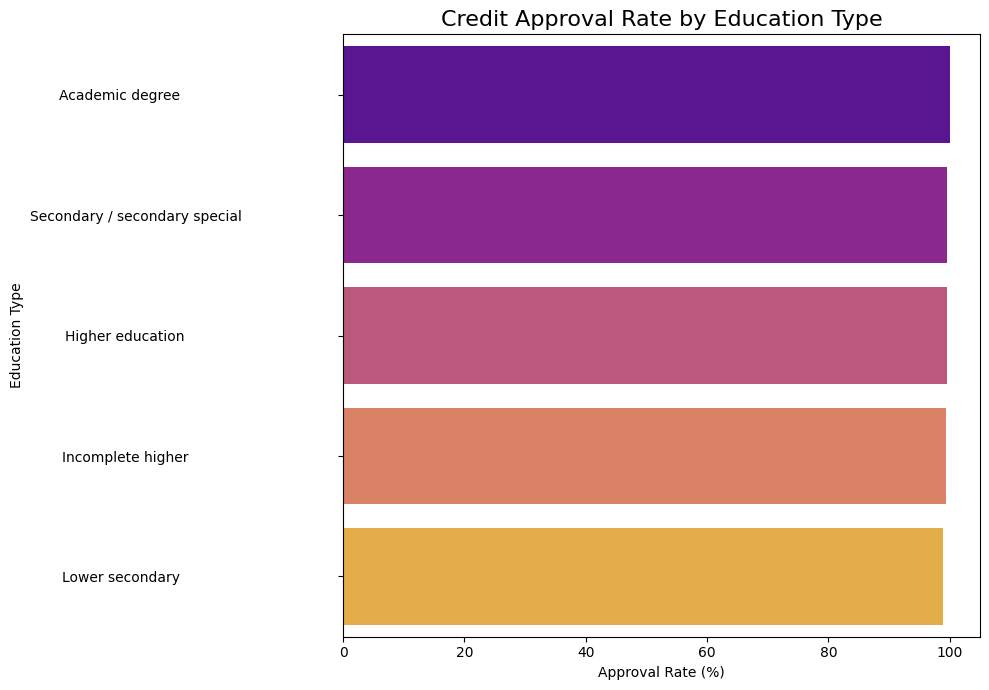

In [24]:
# --- Step 1: Data Preparation - Calculate the approval rate by education type ---

# Use .mean() on the 'Status' column (0s and 1s) to get the rate of 1s (approvals).
# Then, sort the values for better visualization.
approval_rate_by_education = (df_credit_approval.groupby('Education_Type')['Status'].mean() * 100).sort_values(ascending=False)

print("Approval Rate by Education Type (%):")
print(approval_rate_by_education)


# --- Step 2: Visualization ---
plt.figure(figsize=(10, 7))

# Switch x and y inputs to create a horizontal plot
sns.barplot(x=approval_rate_by_education.values, y=approval_rate_by_education.index, palette='plasma')

plt.title('Credit Approval Rate by Education Type', fontsize=16)
# Labels are also switched
plt.xlabel('Approval Rate (%)')
plt.ylabel('Education Type')
# No rotation is needed now
plt.tight_layout()

In [25]:
df_loan_default.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68505 entries, 0 to 68504
Data columns (total 43 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ID                    68505 non-null  int64  
 1   Asst_Reg              68505 non-null  int64  
 2   GGGrade               68505 non-null  object 
 3   Experience            68505 non-null  object 
 4   Validation            68505 non-null  object 
 5   Yearly_Income         68505 non-null  float64
 6   Home_Status           68505 non-null  object 
 7   Unpaid_2_years        68505 non-null  int64  
 8   Already_Defaulted     68505 non-null  int64  
 9   Designation           68505 non-null  object 
 10  Debt_to_Income        68505 non-null  float64
 11  Postal_Code           68505 non-null  float64
 12  Lend_Amount           68505 non-null  float64
 13  Deprecatory_Records   68505 non-null  int64  
 14  Interest_Charged      68505 non-null  float64
 15  Usage_Rate         

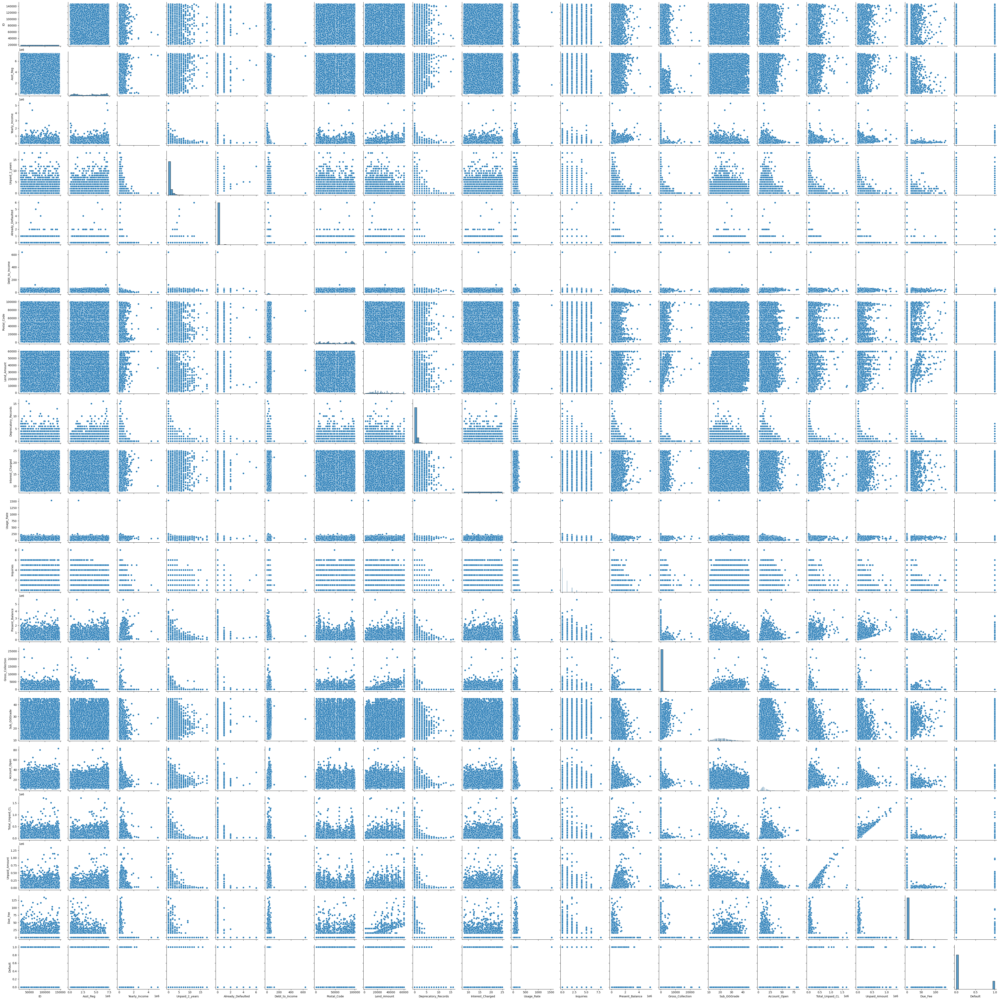

In [26]:
sns.pairplot(df_loan_default.iloc[:,:30])

<Axes: >

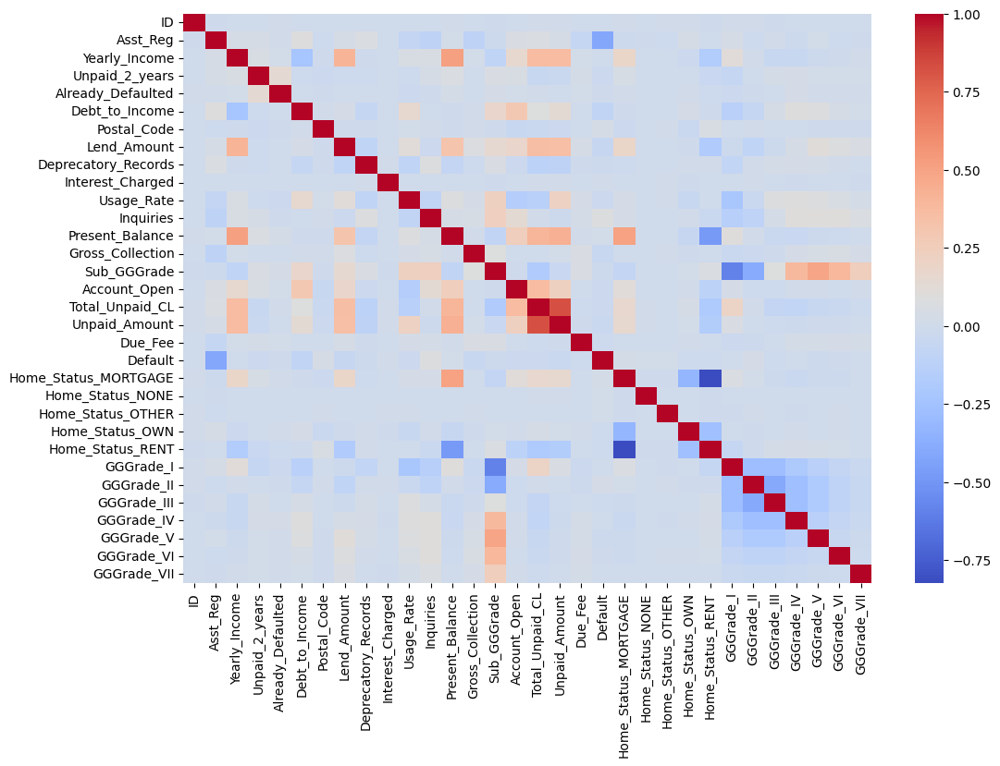

In [27]:
num_df_loan = df_loan_default.select_dtypes(include='number')
plt.figure(figsize=(12,8)); sns.heatmap(num_df_loan.corr(), annot=False, cmap='coolwarm')

In [28]:
num_df_loan.corr()






,ID,Asst_Reg,Yearly_Income,Unpaid_2_years,Already_Defaulted,Debt_to_Income,Postal_Code,Lend_Amount,Deprecatory_Records,Interest_Charged,...,Home_Status_OTHER,Home_Status_OWN,Home_Status_RENT,GGGrade_I,GGGrade_II,GGGrade_III,GGGrade_IV,GGGrade_V,GGGrade_VI,GGGrade_VII
ID,1.000000,-0.004232,-0.002954,-0.000838,0.006410,-0.001687,-0.002539,-0.001500,-0.000352,0.000441,...,0.005196,0.003234,-0.005621,0.003711,0.005363,-0.005156,-0.003873,-0.000390,0.000112,0.000434
Asst_Reg,-0.004232,1.000000,0.036625,0.036358,0.008668,0.088797,-0.015534,0.037526,0.063968,-0.003003,...,-0.014642,0.033111,0.000584,0.032705,-0.017073,0.009722,-0.025343,0.012746,-0.015716,-0.006475
Yearly_Income,-0.002954,0.036625,1.000000,0.051989,0.015004,-0.227349,-0.005954,0.410832,-0.007496,0.001859,...,-0.003286,-0.028567,-0.167945,0.110866,0.010103,-0.048044,-0.047851,-0.020367,-0.008432,0.007244
Unpaid_2_years,-0.000838,0.036358,0.051989,1.000000,0.139745,-0.016802,-0.030803,-0.015491,-0.013334,0.000244,...,-0.001761,0.000705,-0.044094,-0.064727,-0.002350,0.019059,0.024651,0.015907,0.013853,0.010876
Already_Defaulted,0.006410,0.008668,0.015004,0.139745,1.000000,0.002987,-0.006580,-0.001469,0.001924,-0.000999,...,-0.000623,0.005009,-0.012044,-0.025477,-0.007591,0.002534,0.024770,0.003185,0.009227,0.004212
Debt_to_Income,-0.001687,0.088797,-0.227349,-0.016802,0.002987,1.000000,0.006881,0.030387,-0.061234,-0.002150,...,0.001877,0.031515,-0.008978,-0.128896,-0.064734,0.036368,0.088844,0.080718,0.032239,0.010778
Postal_Code,-0.002539,-0.015534,-0.005954,-0.030803,-0.006580,0.006881,1.000000,-0.007362,-0.008640,-0.001504,...,0.004863,-0.036729,0.048375,0.000640,0.008562,-0.000531,-0.002749,-0.005746,-0.004369,-0.007970
Lend_Amount,-0.001500,0.037526,0.410832,-0.015491,-0.001469,0.030387,-0.007362,1.000000,-0.090159,-0.002594,...,-0.000306,-0.008545,-0.180832,-0.023557,-0.090882,-0.021703,0.037716,0.106305,0.079994,0.053864
Deprecatory_Records,-0.000352,0.063968,-0.007496,-0.013334,0.001924,-0.061234,-0.008640,-0.090159,1.000000,0.004287,...,-0.003303,0.009798,0.007189,-0.077670,0.007559,0.020382,0.029544,0.017528,0.004302,-0.002689
Interest_Charged,0.000441,-0.003003,0.001859,0.000244,-0.000999,-0.002150,-0.001504,-0.002594,0.004287,1.000000,...,0.008645,-0.005026,0.000317,0.002066,0.003742,0.001715,-0.005375,-0.003558,0.002465,-0.008975


Default Rate by Loan Grade (%):
GGGrade
I      18.739874
II     20.781282
III    18.030327
IV     18.724033
V      16.176471
VI     17.863297
VII    18.367347
Name: Default, dtype: float64


C:\Users\abcbb\AppData\Local\Temp\ipykernel_48788\1804143996.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=default_rate_by_grade.index, y=default_rate_by_grade.values, palette='YlOrRd')


Text(0, 0.5, 'Default Rate (%)')

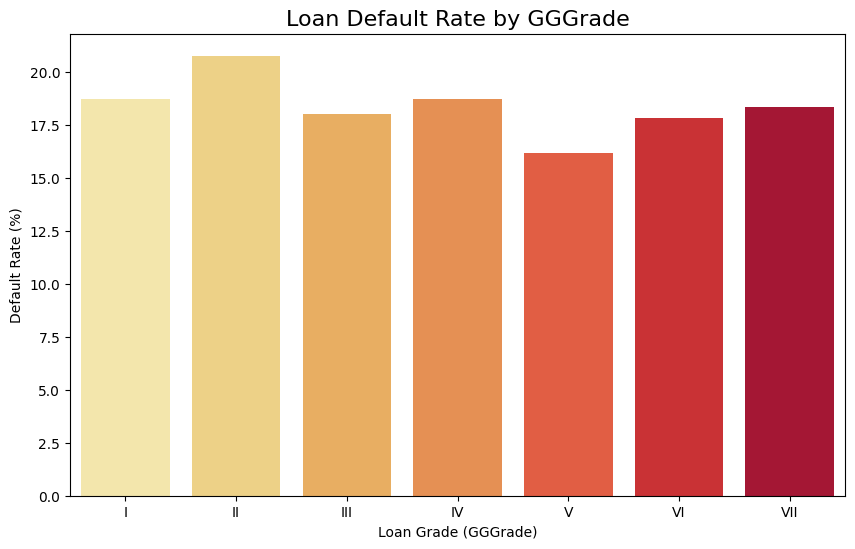

In [29]:
# --- Step 1: Data Preparation - Calculate the default rate by GGGrade ---

# Group by 'GGGrade', calculate the mean of 'Default' to get the rate, and multiply by 100 for percentage.
# We sort by the index to keep the grades in a logical order (I, II, III...).
default_rate_by_grade = (df_loan_default.groupby('GGGrade')['Default'].mean() * 100).sort_index()

print("Default Rate by Loan Grade (%):")
print(default_rate_by_grade)


# --- Step 2: Visualization ---

plt.figure(figsize=(10, 6))
sns.barplot(x=default_rate_by_grade.index, y=default_rate_by_grade.values, palette='YlOrRd')
plt.title('Loan Default Rate by GGGrade', fontsize=16)
plt.xlabel('Loan Grade (GGGrade)')
plt.ylabel('Default Rate (%)')

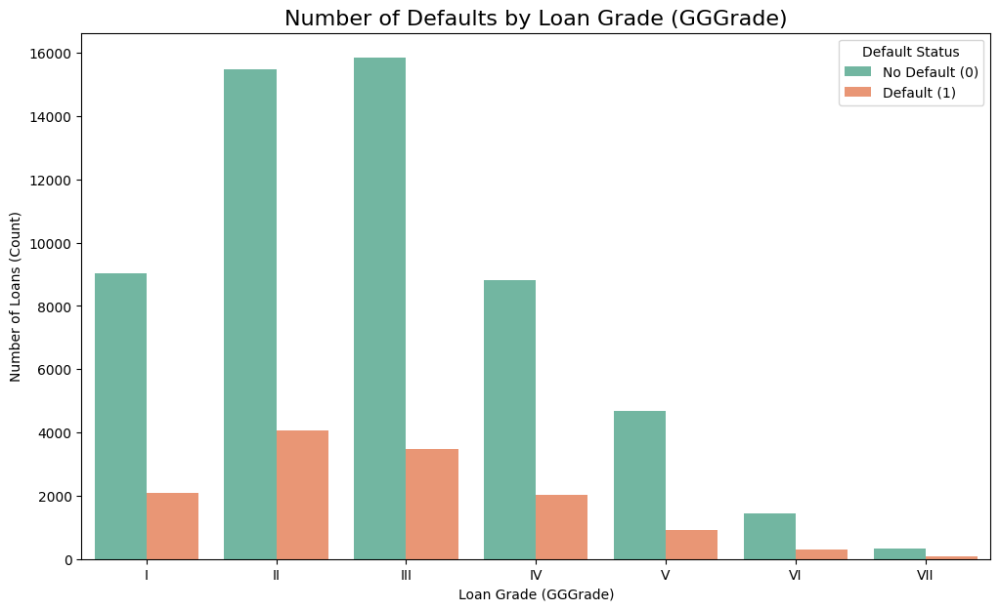

In [30]:
# To ensure the grades are plotted in a logical order (I, II, III...), we define the order first.
grade_order = sorted(df_loan_default['GGGrade'].unique())

plt.figure(figsize=(12, 7))

# Create a countplot to see the number of defaults vs non-defaults for each grade
sns.countplot(data=df_loan_default, x='GGGrade', hue='Default', order=grade_order, palette='Set2')

plt.title('Number of Defaults by Loan Grade (GGGrade)', fontsize=16)
plt.xlabel('Loan Grade (GGGrade)')
plt.ylabel('Number of Loans (Count)')
plt.legend(title='Default Status', labels=['No Default (0)', 'Default (1)'])
plt.show()

Default Rate by Loan Reason (%):
Reason
wedding                57.317073
RENTwable  energy      40.000000
house                  32.692308
car                    21.014493
home  improvement      19.738903
medical                19.585987
debt  consolidation    19.370266
major  purchase        19.214347
small  business        18.494272
moving                 18.393782
vacation               18.380062
other                  17.981714
credit  card           17.108375
Name: Default, dtype: float64


C:\Users\abcbb\AppData\Local\Temp\ipykernel_48788\1043091816.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=default_rate_by_reason.values, y=default_rate_by_reason.index, palette='magma')


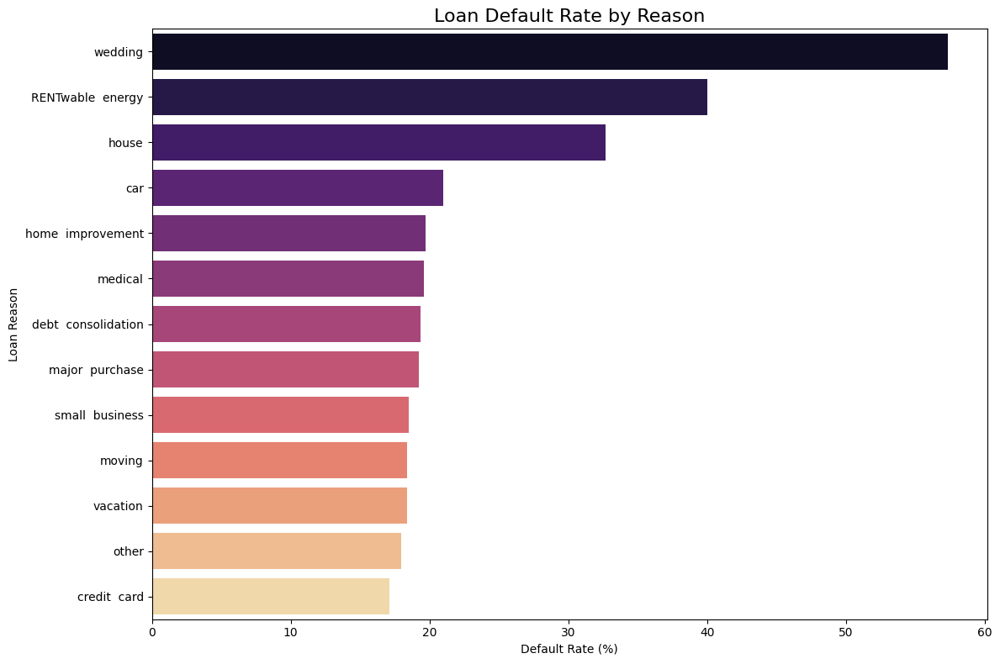

In [31]:
# --- Step 1: Data Preparation - Calculate the default rate by Reason ---

# Group by 'Reason', calculate the mean of 'Default' to get the rate, and sort the values.
default_rate_by_reason = (df_loan_default.groupby('Reason')['Default'].mean() * 100).sort_values(ascending=False)

print("Default Rate by Loan Reason (%):")
print(default_rate_by_reason)


# --- Step 2: Visualization as a Horizontal Bar Chart ---

plt.figure(figsize=(12, 8))

# Create a horizontal bar plot of the calculated default rates
sns.barplot(x=default_rate_by_reason.values, y=default_rate_by_reason.index, palette='magma')

plt.title('Loan Default Rate by Reason', fontsize=16)
plt.xlabel('Default Rate (%)')
plt.ylabel('Loan Reason')
plt.tight_layout()
plt.show()

# Conclusions by dataset  

### 1. Fraud Transactions (`fraud_train_processed.csv`)  
* **Usability** – Balanced, timestamped data suitable for classification.  
* **Outliers** – Very high `amt` values and a fraud-rate spike at 01-03 a.m.; flag or winsorise.  
* **Redundancy** – One-hot dummies for merchant/category are collinear; drop one of each set.  
* **Temporal drift** – Hour-of-day profile is stable; test drift across dates before deployment.  
* **Confounders** – Card-present flag likely drives both `amt` and fraud; include it.

### 2. Credit Approval (`credit_approval_processed.csv`)  
* **Usability** – Target (approval) is ~98 % “yes”; ceiling effect may harm prediction—consider redefining target (e.g., default).  
* **Outliers** – A few enormous `Total_Bad_Debt` values; winsorise.  
* **Redundancy** – Age, years-at-job, years-at-residence correlate (~0.68–0.71); drop or combine.  
* **Temporal drift** – No date field; if raw data contain `application_date`, plot approval-rate by month.  
* **Confounders** – Income and employment status likely explain education-approval link; adjust for them.

### 3. Loan Default (`loan_default_processed.csv`)  
* **Usability** – Default-rate varies by purpose and grade; good variance.  
* **Outliers** – A handful of loans > $50 k (small-business, medical); verify or cap.  
* **Redundancy** – Interest-rate, installment, DTI highly correlated (~0.85); keep one.  
* **Temporal drift** – Plot default-rate by issue-year to detect credit-cycle effects.  
* **Confounders** – Grade subsumes much of purpose impact; stratify or drop one.


# 4. Storytelling With Data plot

Reproduce any graph of your choice in p. 86-98 of the Storytelling With Data book as best you can.  (The second half of chapter three).  You do not have to get the exact data values right, just the overall look and feel.

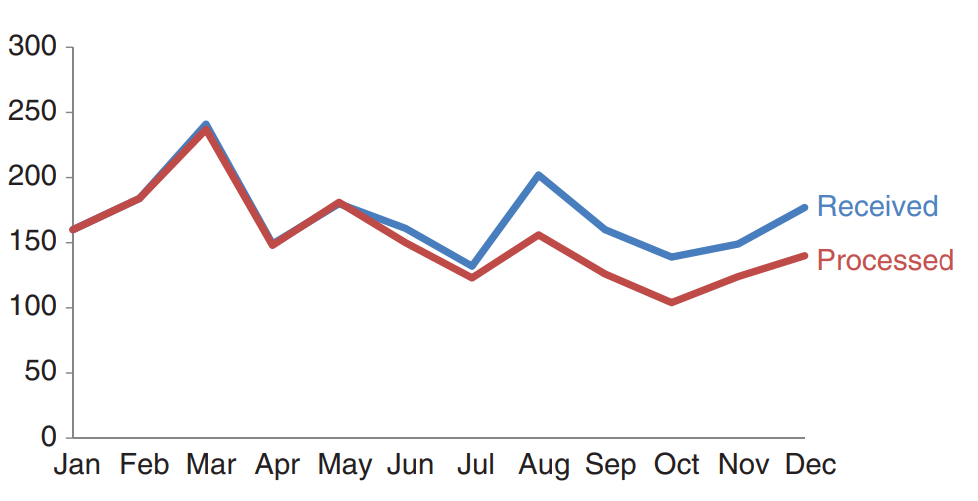

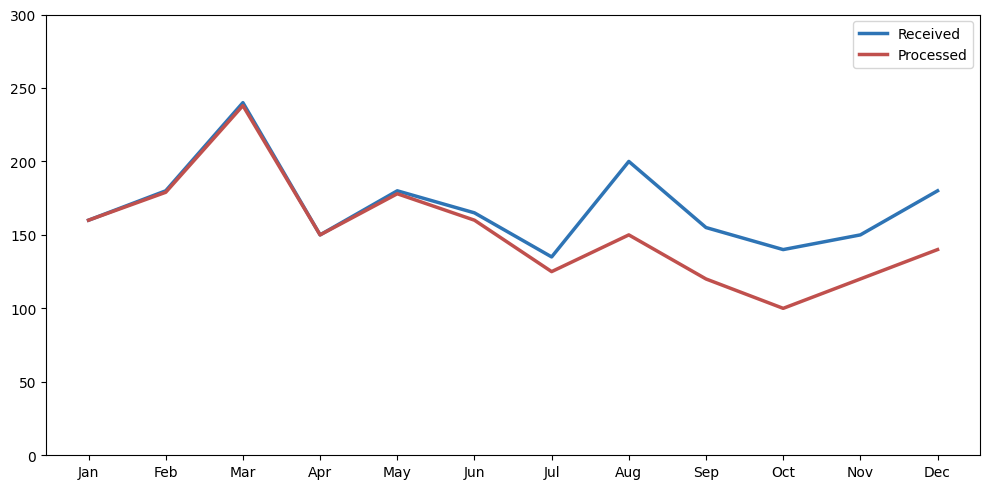

In [32]:
months = ['Jan','Feb','Mar','Apr','May','Jun',
          'Jul','Aug','Sep','Oct','Nov','Dec']
received  = [160,180,240,150,180,165,135,200,155,140,150,180]
processed = [160,179,238,150,178,160,125,150,120,100,120,140]

color_received  = '#2e74b5'
color_processed = '#c0504d'

plt.figure(figsize=(10,5))
plt.plot(months, received, linewidth=2.5, color=color_received,  label='Received')
plt.plot(months, processed, linewidth=2.5, color=color_processed, label='Processed')

plt.ylim(0, 300)
plt.grid(False)
plt.legend()
plt.tight_layout()
plt.show()